In [ ]:
#Built using https://blog.keras.io/building-autoencoders-in-keras.html

In [ ]:
%matplotlib inline

In [ ]:
from keras.datasets import mnist
import numpy as np
(x_train, _), (x_test, _) = mnist.load_data()
#We will normalize all values between 0 and 1 and we will flatten the 28x28 images into vectors of size 784.

x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))
print(x_train.shape)
print(x_test.shape)

(60000, 784)
(10000, 784)


In [ ]:
import keras
from keras import layers

# This is the size of our encoded representations
encoding_dim = 32  # 32 floats -> compression of factor 24.5, assuming the input is 784 floats

# This is our input image
input_img = keras.Input(shape=(784,))
# "encoded" is the encoded representation of the input
encoded = layers.Dense(encoding_dim, activation='relu')(input_img)
# "decoded" is the lossy reconstruction of the input
decoded = layers.Dense(784, activation='sigmoid')(encoded)

# This model maps an input to its reconstruction
basic_autoencoder = keras.Model(input_img, decoded)

In [ ]:
# This model maps an input to its encoded representation
basic_encoder = keras.Model(input_img, encoded)

# This is our encoded (32-dimensional) input
encoded_input = keras.Input(shape=(encoding_dim,))
# Retrieve the last layer of the autoencoder model
decoder_layer = basic_autoencoder.layers[-1]
# Create the decoder model
basic_decoder = keras.Model(encoded_input, decoder_layer(encoded_input))

In [ ]:
basic_autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

In [ ]:
basic_autoencoder.fit(x_train, x_train,
                epochs=20,
                batch_size=256,
                shuffle=True,
                validation_data=(x_test, x_test))

Epoch 1/20
235/235 [==============================] - 4s 13ms/step - loss: 0.2771 - val_loss: 0.1894
Epoch 2/20
235/235 [==============================] - 2s 11ms/step - loss: 0.1714 - val_loss: 0.1542
Epoch 3/20
235/235 [==============================] - 3s 11ms/step - loss: 0.1444 - val_loss: 0.1335
Epoch 4/20
235/235 [==============================] - 3s 11ms/step - loss: 0.1283 - val_loss: 0.1211
Epoch 5/20
235/235 [==============================] - 3s 15ms/step - loss: 0.1184 - val_loss: 0.1134
Epoch 6/20
235/235 [==============================] - 3s 11ms/step - loss: 0.1118 - val_loss: 0.1079
Epoch 7/20
235/235 [==============================] - 2s 10ms/step - loss: 0.1070 - val_loss: 0.1037
Epoch 8/20
235/235 [==============================] - 2s 11ms/step - loss: 0.1032 - val_loss: 0.1004
Epoch 9/20
235/235 [==============================] - 2s 11ms/step - loss: 0.1003 - val_loss: 0.0978
Epoch 10/20
235/235 [==============================] - 4s 18ms/step - loss: 0.0982 - val_lo

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%tensorboard --logdir logs

Launching TensorBoard...

<IPython.core.display.Javascript object>

313/313 [==============================] - 1s 2ms/step


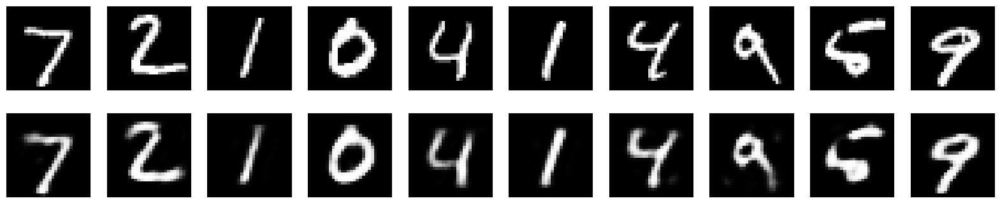

In [ ]:
# Encode and decode some digits
# Note that we take them from the *test* set
encoded_imgs = basic_encoder.predict(x_test)
decoded_imgs = basic_decoder.predict(encoded_imgs)
# Use Matplotlib (don't ask)
import matplotlib.pyplot as plt

n = 10  # How many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
from keras import regularizers

encoding_dim = 32

input_img = keras.Input(shape=(784,))
# Add a Dense layer with a L1 activity regularizer
sparse_encoded = layers.Dense(encoding_dim, activation='relu',
                activity_regularizer=regularizers.l1(10e-5))(input_img)
sparse_decoded = layers.Dense(784, activation='sigmoid')(sparse_encoded)

sparse_autoencoder = keras.Model(input_img, sparse_decoded)

In [ ]:
# This model maps an input to its encoded representation
sparse_encoder = keras.Model(input_img, sparse_encoded)

# This is our encoded (32-dimensional) input
encoded_input = keras.Input(shape=(encoding_dim,))
# Retrieve the last layer of the autoencoder model
decoder_layer = sparse_autoencoder.layers[-1]
# Create the decoder model
sparse_decoder = keras.Model(encoded_input, decoder_layer(encoded_input))

In [ ]:
sparse_autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
sparse_autoencoder.fit(x_train, x_train,
                epochs=20,
                batch_size=256,
                shuffle=True,
                validation_data=(x_test, x_test))

Epoch 1/20
235/235 [==============================] - 4s 12ms/step - loss: 0.2832 - val_loss: 0.1982
Epoch 2/20
235/235 [==============================] - 5s 19ms/step - loss: 0.1792 - val_loss: 0.1626
Epoch 3/20
235/235 [==============================] - 6s 24ms/step - loss: 0.1538 - val_loss: 0.1441
Epoch 4/20
235/235 [==============================] - 3s 14ms/step - loss: 0.1394 - val_loss: 0.1328
Epoch 5/20
235/235 [==============================] - 3s 11ms/step - loss: 0.1298 - val_loss: 0.1246
Epoch 6/20
235/235 [==============================] - 3s 13ms/step - loss: 0.1227 - val_loss: 0.1185
Epoch 7/20
235/235 [==============================] - 3s 11ms/step - loss: 0.1175 - val_loss: 0.1141
Epoch 8/20
235/235 [==============================] - 3s 11ms/step - loss: 0.1138 - val_loss: 0.1110
Epoch 9/20
235/235 [==============================] - 3s 12ms/step - loss: 0.1111 - val_loss: 0.1089
Epoch 10/20
235/235 [==============================] - 3s 11ms/step - loss: 0.1093 - val_lo

313/313 [==============================] - 1s 1ms/step


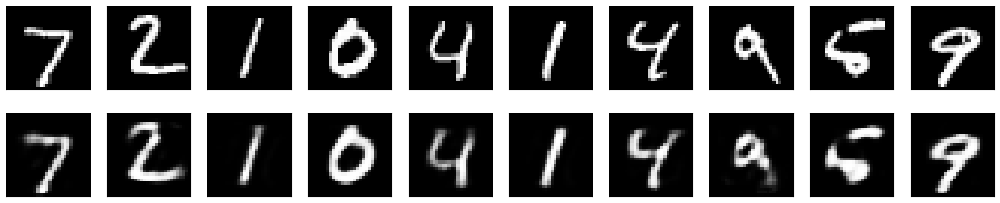

In [ ]:
# Encode and decode some digits
# Note that we take them from the *test* set
encoded_imgs = sparse_encoder.predict(x_test)
decoded_imgs = sparse_decoder.predict(encoded_imgs)
# Use Matplotlib (don't ask)
import matplotlib.pyplot as plt

n = 10  # How many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
input_img = keras.Input(shape=(784,))
encoded = layers.Dense(128, activation='relu')(input_img)
encoded = layers.Dense(64, activation='relu')(encoded)
encoded = layers.Dense(32, activation='relu')(encoded)

decoded = layers.Dense(64, activation='relu')(encoded)
decoded = layers.Dense(128, activation='relu')(decoded)
decoded = layers.Dense(784, activation='sigmoid')(decoded)

stacked_autoencoder = keras.Model(input_img, decoded)
stacked_autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

stacked_autoencoder.fit(x_train, x_train,
                epochs=20,
                batch_size=256,
                shuffle=True,
                validation_data=(x_test, x_test))

Epoch 1/20
235/235 [==============================] - 5s 17ms/step - loss: 0.2421 - val_loss: 0.1626
Epoch 2/20
235/235 [==============================] - 5s 20ms/step - loss: 0.1467 - val_loss: 0.1323
Epoch 3/20
235/235 [==============================] - 4s 16ms/step - loss: 0.1265 - val_loss: 0.1191
Epoch 4/20
235/235 [==============================] - 4s 16ms/step - loss: 0.1178 - val_loss: 0.1133
Epoch 5/20
235/235 [==============================] - 5s 20ms/step - loss: 0.1126 - val_loss: 0.1090
Epoch 6/20
235/235 [==============================] - 4s 16ms/step - loss: 0.1084 - val_loss: 0.1054
Epoch 7/20
235/235 [==============================] - 5s 21ms/step - loss: 0.1052 - val_loss: 0.1021
Epoch 8/20
235/235 [==============================] - 9s 40ms/step - loss: 0.1024 - val_loss: 0.0994
Epoch 9/20
235/235 [==============================] - 5s 23ms/step - loss: 0.0999 - val_loss: 0.0978
Epoch 10/20
235/235 [==============================] - 7s 31ms/step - loss: 0.0982 - val_lo

In [ ]:
input_img = keras.Input(shape=(28, 28, 1))

x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
conv_encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(conv_encoded)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(16, (3, 3), activation='relu')(x)
x = layers.UpSampling2D((2, 2))(x)
conv_decoded = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

conv_autoencoder = keras.Model(input_img, conv_decoded)
conv_autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

In [ ]:
(x_train, _), (x_test, _) = mnist.load_data()

x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))

In [ ]:
from keras.callbacks import TensorBoard
import os, datetime
import tensorflow as tf


logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

conv_autoencoder.fit(x_train, x_train,
                epochs=20,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test, x_test),
                callbacks=[tensorboard_callback])

Epoch 1/20
469/469 [==============================] - 75s 159ms/step - loss: 0.1439 - val_loss: 0.1312
Epoch 2/20
469/469 [==============================] - 76s 162ms/step - loss: 0.1275 - val_loss: 0.1216
Epoch 3/20
469/469 [==============================] - 63s 135ms/step - loss: 0.1200 - val_loss: 0.1160
Epoch 4/20
469/469 [==============================] - 87s 185ms/step - loss: 0.1151 - val_loss: 0.1115
Epoch 5/20
469/469 [==============================] - 75s 159ms/step - loss: 0.1114 - val_loss: 0.1089
Epoch 6/20
469/469 [==============================] - 68s 146ms/step - loss: 0.1088 - val_loss: 0.1064
Epoch 7/20
469/469 [==============================] - 66s 140ms/step - loss: 0.1069 - val_loss: 0.1050
Epoch 8/20
469/469 [==============================] - 71s 151ms/step - loss: 0.1055 - val_loss: 0.1036
Epoch 9/20
469/469 [==============================] - 86s 183ms/step - loss: 0.1042 - val_loss: 0.1025
Epoch 10/20
469/469 [==============================] - 61s 130ms/step - l

313/313 [==============================] - 3s 11ms/step


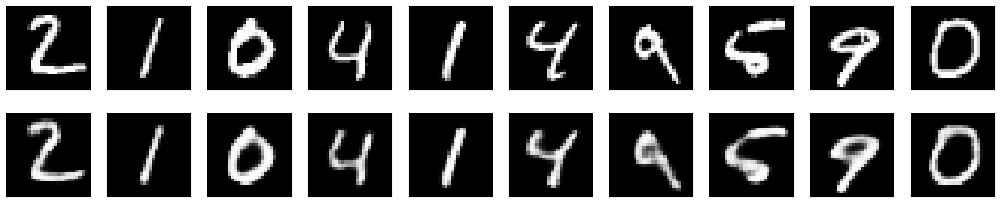

In [ ]:
decoded_imgs = conv_autoencoder.predict(x_test)

n = 10
plt.figure(figsize=(20, 4))
for i in range(1, n + 1):
    # Display original
    ax = plt.subplot(2, n, i)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

313/313 [==============================] - 2s 6ms/step


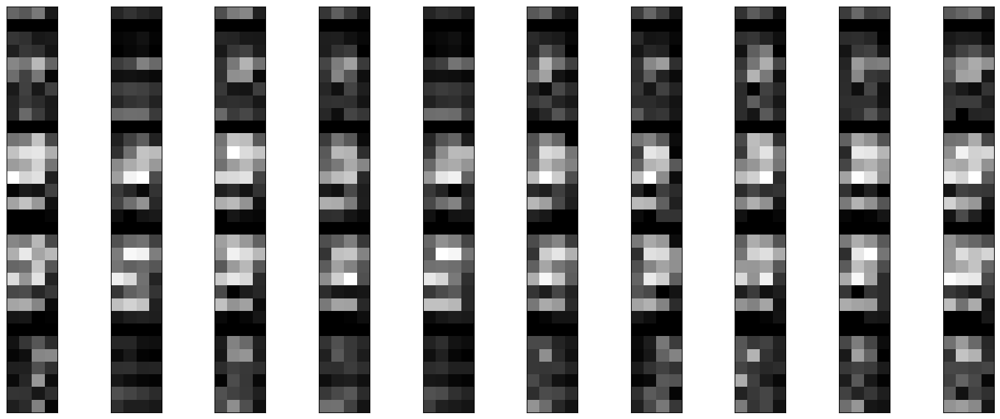

In [ ]:
encoder = keras.Model(input_img, conv_encoded)
encoded_imgs = encoder.predict(x_test)

n = 10
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs[i].reshape((4, 4 * 8)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
noise_factor = 0.7
x_train_noisy = x_train + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_train.shape)
x_test_noisy = x_test + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_test.shape)

x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_test_noisy = np.clip(x_test_noisy, 0., 1.)

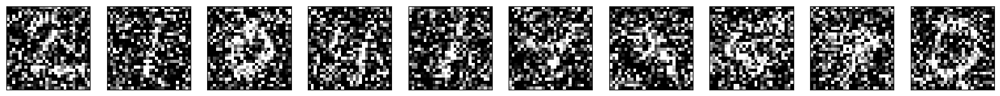

In [ ]:
import matplotlib.pyplot as plt
n = 10
plt.figure(figsize=(20, 2))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(x_test_noisy[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
input_img = keras.Input(shape=(28, 28, 1))

x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
denoising_encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

# At this point the representation is (7, 7, 32)

x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(denoising_encoded)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
denoising_decoded = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

DAE = keras.Model(input_img, denoising_decoded)
DAE.compile(optimizer='adam', loss='binary_crossentropy')

In [ ]:
from keras.callbacks import TensorBoard
import os, datetime
import tensorflow as tf


logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [ ]:
DAE.fit(x_train_noisy, x_train,
                epochs=20,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test_noisy, x_test),
                callbacks=[tensorboard_callback])

Epoch 1/20
469/469 [==============================] - 135s 285ms/step - loss: 0.1882 - val_loss: 0.1462
Epoch 2/20
469/469 [==============================] - 128s 272ms/step - loss: 0.1421 - val_loss: 0.1369
Epoch 3/20
469/469 [==============================] - 127s 272ms/step - loss: 0.1356 - val_loss: 0.1324
Epoch 4/20
469/469 [==============================] - 126s 269ms/step - loss: 0.1322 - val_loss: 0.1297
Epoch 5/20
469/469 [==============================] - 130s 278ms/step - loss: 0.1301 - val_loss: 0.1289
Epoch 6/20
469/469 [==============================] - 130s 277ms/step - loss: 0.1283 - val_loss: 0.1267
Epoch 7/20
469/469 [==============================] - 131s 279ms/step - loss: 0.1271 - val_loss: 0.1258
Epoch 8/20
469/469 [==============================] - 124s 265ms/step - loss: 0.1260 - val_loss: 0.1246
Epoch 9/20
469/469 [==============================] - 124s 265ms/step - loss: 0.1251 - val_loss: 0.1237
Epoch 10/20
469/469 [==============================] - 124s 265m

313/313 [==============================] - 11s 35ms/step


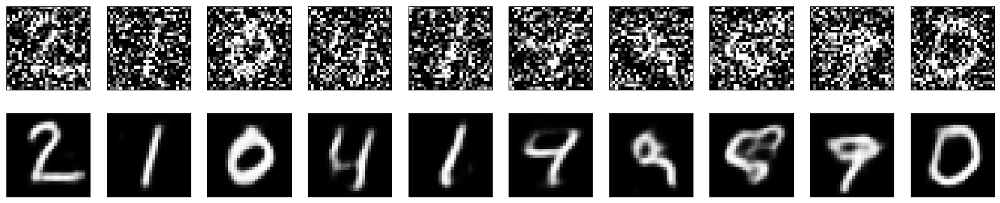

In [ ]:
decoded_imgs = DAE.predict(x_test_noisy)

n = 10
plt.figure(figsize=(20, 4))
for i in range(1, n + 1):
    # Display original
    ax = plt.subplot(2, n, i)
    plt.imshow(x_test_noisy[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
#seq2seq autoencoder
timesteps = ...  # Length of your sequences
input_dim = ...
latent_dim = ...

inputs = keras.Input(shape=(timesteps, input_dim))
encoded = layers.LSTM(latent_dim)(inputs)

decoded = layers.RepeatVector(timesteps)(encoded)
decoded = layers.LSTM(input_dim, return_sequences=True)(decoded)

sequence_autoencoder = keras.Model(inputs, decoded)
encoder = keras.Model(inputs, encoded)

TypeError: Dimension value must be integer or None or have an __index__ method, got value 'Ellipsis' with type '<class 'ellipsis'>'

In [ ]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import numpy as np
import tensorflow as tf
import keras
from keras import layers

In [ ]:
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


In [ ]:
latent_dim = 2

encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
vae_encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="vae_encoder")
vae_encoder.summary()

Model: "vae_encoder"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 28, 28, 1)]          0         []                            
                                                                                                  
 conv2d_2 (Conv2D)           (None, 14, 14, 32)           320       ['input_7[0][0]']             
                                                                                                  
 conv2d_3 (Conv2D)           (None, 7, 7, 64)             18496     ['conv2d_2[0][0]']            
                                                                                                  
 flatten_1 (Flatten)         (None, 3136)                 0         ['conv2d_3[0][0]']            
                                                                                        

In [ ]:
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(7 * 7 * 64, activation="relu")(latent_inputs)
x = layers.Reshape((7, 7, 64))(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
vae_decoder = keras.Model(latent_inputs, decoder_outputs, name="vae_decoder")
vae_decoder.summary()

Model: "vae_decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 2)]               0         
                                                                 
 dense_21 (Dense)            (None, 3136)              9408      
                                                                 
 reshape (Reshape)           (None, 7, 7, 64)          0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 14, 14, 64)        36928     
 anspose)                                                        
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 28, 28, 32)        18464     
 Transpose)                                                      
                                                                 
 conv2d_transpose_2 (Conv2D  (None, 28, 28, 1)         

In [ ]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(data, reconstruction),
                    axis=(1, 2),
                )
            )
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

In [ ]:
(x_train, _), (x_test, _) = keras.datasets.mnist.load_data()
mnist_digits = np.concatenate([x_train, x_test], axis=0)
mnist_digits = np.expand_dims(mnist_digits, -1).astype("float32") / 255

vae = VAE(vae_encoder, vae_decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(mnist_digits, epochs=20, batch_size=128)

Epoch 1/20
547/547 [==============================] - 101s 180ms/step - loss: 201.7651 - reconstruction_loss: 180.6773 - kl_loss: 4.5950
Epoch 2/20
547/547 [==============================] - 92s 169ms/step - loss: 164.8809 - reconstruction_loss: 157.8508 - kl_loss: 5.3621
Epoch 3/20
547/547 [==============================] - 93s 171ms/step - loss: 159.7778 - reconstruction_loss: 153.2598 - kl_loss: 5.5490
Epoch 4/20
547/547 [==============================] - 91s 167ms/step - loss: 156.8773 - reconstruction_loss: 150.7682 - kl_loss: 5.7021
Epoch 5/20
547/547 [==============================] - 93s 171ms/step - loss: 155.1551 - reconstruction_loss: 149.0939 - kl_loss: 5.7907
Epoch 6/20
547/547 [==============================] - 100s 182ms/step - loss: 154.1408 - reconstruction_loss: 147.9893 - kl_loss: 5.8752
Epoch 7/20
547/547 [==============================] - 103s 187ms/step - loss: 153.1004 - reconstruction_loss: 147.0532 - kl_loss: 5.9512
Epoch 8/20
547/547 [=========================

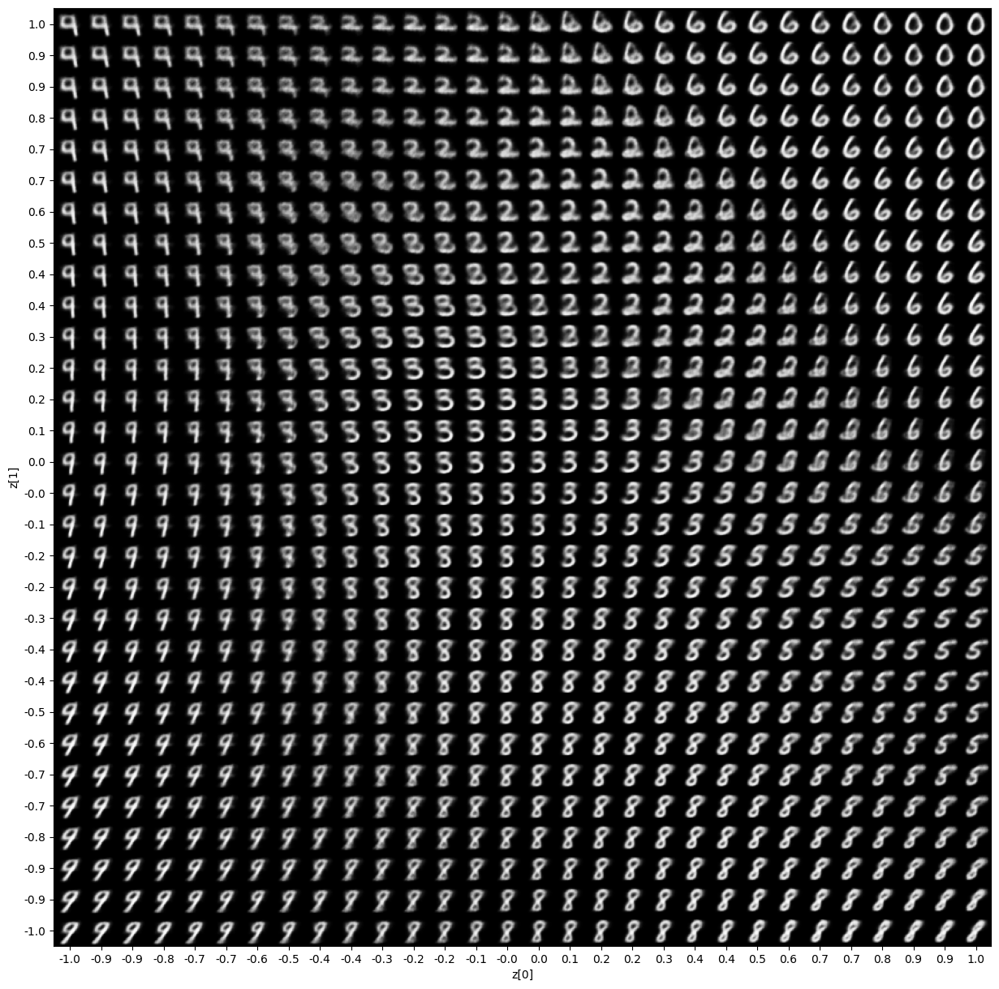

In [ ]:
import matplotlib.pyplot as plt


def plot_latent_space(vae, n=30, figsize=15):
    # display a n*n 2D manifold of digits
    digit_size = 28
    scale = 1.0
    figure = np.zeros((digit_size * n, digit_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of digit classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = vae.decoder.predict(z_sample, verbose=0)
            digit = x_decoded[0].reshape(digit_size, digit_size)
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()


plot_latent_space(vae)

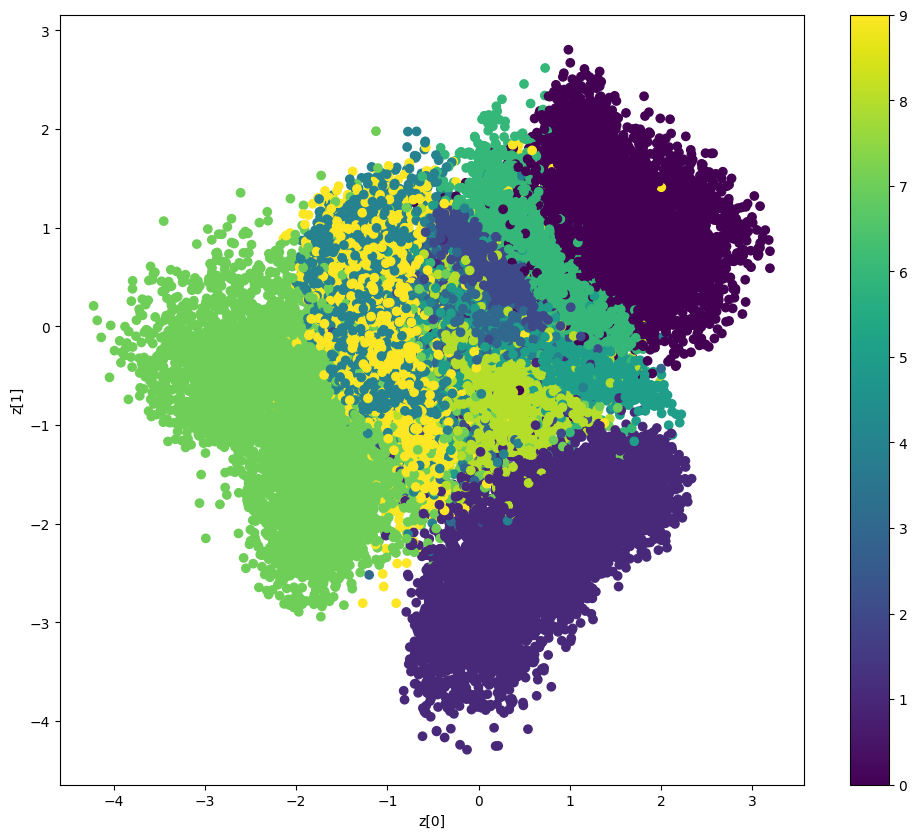

In [ ]:
def plot_label_clusters(vae, data, labels):
    # display a 2D plot of the digit classes in the latent space
    z_mean, _, _ = vae.encoder.predict(data, verbose=0)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()


(x_train, y_train), _ = keras.datasets.mnist.load_data()
x_train = np.expand_dims(x_train, -1).astype("float32") / 255

plot_label_clusters(vae, x_train, y_train)

In [ ]:
original_dim = 28 * 28
intermediate_dim = 64
latent_dim = 2

inputs = keras.Input(shape=(original_dim,))
h = layers.Dense(intermediate_dim, activation='relu')(inputs)
z_mean = layers.Dense(latent_dim)(h)
z_log_sigma = layers.Dense(latent_dim)(h)
#We can use these parameters to sample new similar points from the latent space:

from keras import backend as K

def sampling(args):
    z_mean, z_log_sigma = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim),
                              mean=0., stddev=0.1)
    return z_mean + K.exp(z_log_sigma) * epsilon

z = layers.Lambda(sampling)([z_mean, z_log_sigma])
#Finally, we can map these sampled latent points back to reconstructed inputs:

# Create encoder
var_encoder = keras.Model(inputs, [z_mean, z_log_sigma, z], name='var_encoder')

# Create decoder
latent_inputs = keras.Input(shape=(latent_dim,), name='z_sampling')
x = layers.Dense(intermediate_dim, activation='relu')(latent_inputs)
outputs = layers.Dense(original_dim, activation='sigmoid')(x)
var_decoder = keras.Model(latent_inputs, outputs, name='var_decoder')

# instantiate VAE model
outputs = var_decoder(var_encoder(inputs)[2])
vae = keras.Model(inputs, outputs, name='vae_mlp')
#What we've done so far allows us to instantiate 3 models:

#an end-to-end autoencoder mapping inputs to reconstructions
#an encoder mapping inputs to the latent space
#a generator that can take points on the latent space and will output the corresponding reconstructed samples.
#We train the model using the end-to-end model, with a custom loss function: the sum of a reconstruction term, and the KL divergence regularization term.

reconstruction_loss = keras.losses.binary_crossentropy(inputs, outputs)
reconstruction_loss *= original_dim
kl_loss = 1 + z_log_sigma - K.square(z_mean) - K.exp(z_log_sigma)
kl_loss = K.sum(kl_loss, axis=-1)
kl_loss *= -0.5
vae_loss = K.mean(reconstruction_loss + kl_loss)
vae.add_loss(vae_loss)
vae.compile(optimizer='adam')
#We train our VAE on MNIST digits:

(x_train, y_train), (x_test, y_test) = mnist.load_data()

x_train = x_train.astype('float32') / 255.
x_test = x_test.astype('float32') / 255.
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))

vae.fit(x_train, x_train,
        epochs=20,
        batch_size=32,
        validation_data=(x_test, x_test))
#Because our latent space is two-dimensional, there are a few cool visualizations that can be done at this point. One is to look at the neighborhoods of different classes on the latent 2D plane:

Epoch 1/20
1875/1875 [==============================] - 12s 5ms/step - loss: 190.1065 - val_loss: 170.8687
Epoch 2/20
1875/1875 [==============================] - 9s 5ms/step - loss: 167.5899 - val_loss: 164.2253
Epoch 3/20
1875/1875 [==============================] - 9s 5ms/step - loss: 163.4479 - val_loss: 161.5692
Epoch 4/20
1875/1875 [==============================] - 10s 6ms/step - loss: 160.8451 - val_loss: 159.3063
Epoch 5/20
1875/1875 [==============================] - 12s 6ms/step - loss: 158.4048 - val_loss: 157.4497
Epoch 6/20
1875/1875 [==============================] - 10s 5ms/step - loss: 156.7701 - val_loss: 156.1844
Epoch 7/20
1875/1875 [==============================] - 10s 5ms/step - loss: 155.6637 - val_loss: 155.2776
Epoch 8/20
1875/1875 [==============================] - 9s 5ms/step - loss: 154.8372 - val_loss: 154.3807
Epoch 9/20
1875/1875 [==============================] - 12s 6ms/step - loss: 154.1717 - val_loss: 154.0780
Epoch 10/20
1875/1875 [=================

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
x_test_encoded = var_encoder.predict(x_test, batch_size=32)
plt.figure(figsize=(6, 6))
plt.scatter(x_test_encoded[:, 0], x_test_encoded[:, 1], c=y_test)
plt.colorbar()
plt.show()
#vae classes plane

#Each of these colored clusters is a type of digit. Close clusters are digits that are structurally similar (i.e. digits that share information in the latent space).

#Because the VAE is a generative model, we can also use it to generate new digits! Here we will scan the latent plane, sampling latent points at regular intervals, and generating the corresponding digit for each of these points. This gives us a visualization of the latent manifold that "generates" the MNIST digits.



313/313 [==============================] - 1s 2ms/step


TypeError: list indices must be integers or slices, not tuple

<Figure size 600x600 with 0 Axes>

In [ ]:
# Display a 2D manifold of the digits
n = 15  # figure with 15x15 digits
digit_size = 28
figure = np.zeros((digit_size * n, digit_size * n))
# We will sample n points within [-15, 15] standard deviations
grid_x = np.linspace(-15, 15, n)
grid_y = np.linspace(-15, 15, n)

for i, yi in enumerate(grid_x):
    for j, xi in enumerate(grid_y):
        z_sample = np.array([[xi, yi]])
        x_decoded = var_decoder.predict(z_sample)
        digit = x_decoded[0].reshape(digit_size, digit_size)
        figure[i * digit_size: (i + 1) * digit_size,
               j * digit_size: (j + 1) * digit_size] = digit

plt.figure(figsize=(10, 10))
plt.imshow(figure)
plt.show()